# Create Views to visualize potential solar energy profits

This section attempts to visualise the potential of solar engergy within a political community.

In [1]:
import json #library to handle json files.
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#!pip install geopy  # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!pip install WordCloud
from wordcloud import WordCloud

# Matplotlib and associated plotting modules
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker
%matplotlib inline

# notice: installing seaborn might takes a few minutes
!pip install seaborn
import seaborn as sns
sns.set_style("darkgrid")

!pip install requests
import requests

!pip install geopandas
import geopandas as gpd

!pip install folium  # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

print('Libraries imported.')

Libraries imported.


# Read CSV

Read the CSV Data into pandas dataframes.

In [2]:
dachflaecheProGemeinde = pd.read_csv('./data/summe_dachflaechen_pro_gemeinde.csv')
ertragProGemeinde = pd.read_csv('./data/summe_ertrag_pro_gemeinde.csv')

print(dachflaecheProGemeinde.head())
print(ertragProGemeinde.head())

    GGDENAME GDEKT  Summe_Flaeche
0     Aadorf    TG   7.932415e+05
1      Aarau    AG   1.160732e+06
2    Aarberg    BE   3.332756e+05
3    Aarburg    AG   4.033862e+05
4  Aarwangen    BE   3.493775e+05
    GGDENAME GDEKT  Summe_Stromertrag
0     Aadorf    TG          140281884
1      Aarau    AG          197438694
2    Aarberg    BE           61590005
3    Aarburg    AG           70021083
4  Aarwangen    BE           61100738


# Calculates averages (for visualization)

Calculate all averages for visualization on the map.

In [3]:
averageFlaeche = dachflaecheProGemeinde['Summe_Flaeche'].mean()
averageErtrag = ertragProGemeinde['Summe_Stromertrag'].mean()

In [4]:
print('Downloading Municipality geojson')

data = requests.get("https://datahub.io/cividi/ch-municipalities/r/gemeinden-geojson.geojson")
dataGeojson = data.json()
gdf = gpd.GeoDataFrame.from_features(dataGeojson["features"])
print(gdf.head())
print('Done')

                                            geometry  gemeinde.BFS_NUMMER  \
0  MULTIPOLYGON Z (((8.50388 47.27308 720.72250, ...                    1   
1  MULTIPOLYGON Z (((8.41466 47.29360 463.84375, ...                    2   
2  MULTIPOLYGON Z (((8.44132 47.31583 579.46875, ...                    3   
3  MULTIPOLYGON Z (((8.57437 47.21707 545.69750, ...                    4   
4  MULTIPOLYGON Z (((8.43621 47.31520 609.31500, ...                    5   

        gemeinde.NAME kanton.KUERZEL kanton.NAME  
0     Aeugst am Albis             ZH      Zürich  
1  Affoltern am Albis             ZH      Zürich  
2          Bonstetten             ZH      Zürich  
3     Hausen am Albis             ZH      Zürich  
4            Hedingen             ZH      Zürich  
Done


# Visualizes the roof area and electric capacity of a city within a map of Switzerland

On the map, the area of each municipality is colored according to the following rules, given the roof area and the profit.

If the area and the profit are above average: GREEN
If the area and the profit are below average: ORANGE
If the area is above, and the profit is below average: RED
If the area is below average, and the profit is above average: GREEN

In [5]:
import folium 

# create a map
m = folium.Map(location=[47.1354367,8.5051199], zoom_start=8)

for _, r in gdf.iterrows():
    
    dachflaecheRow = dachflaecheProGemeinde.loc[dachflaecheProGemeinde['GGDENAME'] == r['gemeinde.NAME']]
    ertragRow = ertragProGemeinde.loc[ertragProGemeinde['GGDENAME'] == r['gemeinde.NAME']]
    
    
    fillColor = 'grey'
    if dachflaecheRow.empty:
        popupText = ', '.join([r['gemeinde.NAME']])
    if ertragRow.empty:
        popupText = ', '.join([r['gemeinde.NAME']])
    else:
        ertragText = str(ertragRow['Summe_Stromertrag'])
        dachflaecheText = str(dachflaecheRow['Summe_Flaeche'])
        ertrag = ertragRow['Summe_Stromertrag'].iat[0]
        flaeche = dachflaecheRow['Summe_Flaeche'].iat[0]
        popupText = ', '.join([r['gemeinde.NAME'],str(ertrag),str(flaeche)])
        
        if flaeche > averageFlaeche:
            if averageErtrag > ertrag:
               fillColor = 'green'
        if flaeche < averageFlaeche:
            if averageErtrag < ertrag:
               fillColor = 'orange'
        if flaeche > averageFlaeche:
            if averageErtrag < ertrag:
               fillColor = 'red'
        if flaeche < averageFlaeche:
            if averageErtrag > ertrag:
               fillColor = 'green'
            
    #without simplifying the representation of each borough, the map might not be displayed
    #sim_geo = gpd.GeoSeries(r['geometry'])
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x, fillColor=fillColor: {'fillColor': fillColor, 'opacity':0.1})
    
    folium.Popup(popupText).add_to(geo_j)
    geo_j.add_to(m)

m.save("./data/gemeinden.html")
m

# WordCloud - Roof area

In the picture below, the bigger a municipalities roof area is, the bigger it's name is shown in the Word Cloud.

WordCloud - Dachflaeche per municipality


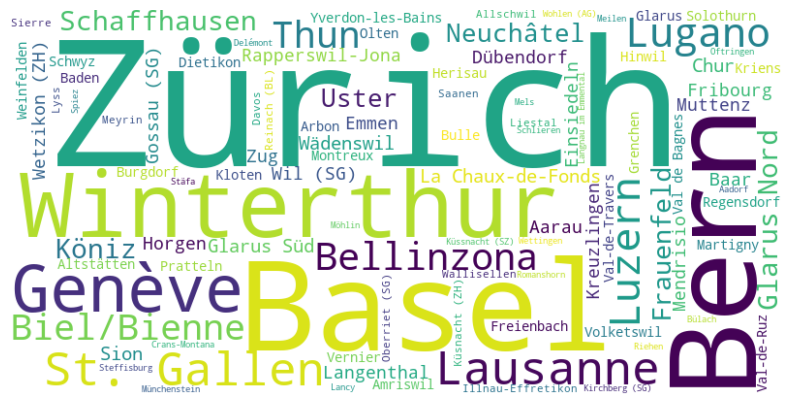

In [6]:
print('WordCloud - Dachflaeche per municipality')

data = dict(zip(dachflaecheProGemeinde['GGDENAME'].tolist(), dachflaecheProGemeinde['Summe_Flaeche'].tolist()))

wc = WordCloud(background_color='white', width=800, height=400, max_words=100).generate_from_frequencies(data)

plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

# WordCloud - Solar profit

In the picture below, the bigger a municipalities profit off solar energy is, the bigger it's name is shown in the Word Cloud.

WordCloud - Sum of electric capacity per municipality


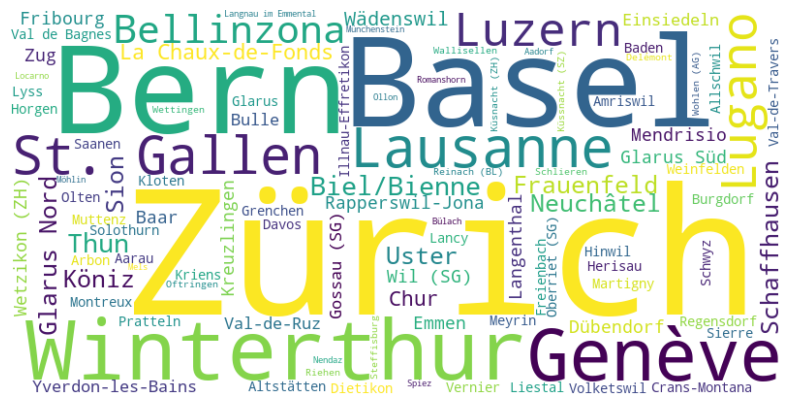

In [7]:
print('WordCloud - Sum of electric capacity per municipality')

data = dict(zip(ertragProGemeinde['GGDENAME'].tolist(), ertragProGemeinde['Summe_Stromertrag'].tolist()))

wc = WordCloud(background_color='white', width=800, height=400, max_words=100).generate_from_frequencies(data)

plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()